<a href="https://colab.research.google.com/github/shreyasavant/INSE_6220_Project/blob/main/Brain_Tumor_Classification_Using_Principal_Component_Analysis_and_Machine_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Brain Tumor Classification Using Principal Component Analysis and Machine Learning: A Comparative Study**

**Install Pycaret**

In [1]:
!pip install pycaret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 481.8/481.8 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 22.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.4/46.4 kB 4.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.8/105.8 kB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.0/150.0 kB 11.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.2/81.2 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.9/16.9 MB 31.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 4.1 MB/s eta 0:00:00


**Import Libraries**

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [3]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  1.5.3
Seaborn version:  0.12.2


**Dataset**

The “Breast Cancer diagnosis Data Set” used for Principle Component Analysis (PCA) and classification models is obtained from Kaggle. The data set provided information about tumor attributes to diagnosed it as benign or malignant for breast cancer.

There are 5 attributes with 569 entries and one column for classification. 
**0 represents Benign and 1 represents Malignant.**


All attributes are numerical and they are listed bellow:

1. mean_radius = MR
2. mean_texture = MT
3. mean_perimeter = MP
4. mean_area = MA
5. mean_smoothness = MS
6. diagnosis (Label)

The original dataset can be found on below link:
https://www.kaggle.com/datasets/theodoravalerie/breast-cancer-data





In [4]:
#read cvs file into dataframe
df = pd.read_csv('/content/brain_tumor.csv')
df.head(25)

,Image,Class,Mean,Variance,Standard Deviation,Entropy,Skewness,Kurtosis,Contrast,Energy,ASM,Homogeneity,Dissimilarity,Correlation
0,Image1,0,6.535339,619.587845,24.891522,0.109059,4.276477,18.900575,98.613971,0.293314,0.086033,0.530941,4.473346,0.981939
1,Image2,0,8.749969,805.957634,28.389393,0.266538,3.718116,14.464618,63.858816,0.475051,0.225674,0.651352,3.220072,0.988834
2,Image3,1,7.341095,1143.808219,33.820234,0.001467,5.061750,26.479563,81.867206,0.031917,0.001019,0.268275,5.981800,0.978014
3,Image4,1,5.958145,959.711985,30.979219,0.001477,5.677977,33.428845,151.229741,0.032024,0.001026,0.243851,7.700919,0.964189
4,Image5,0,7.315231,729.540579,27.010009,0.146761,4.283221,19.079108,174.988756,0.343849,0.118232,0.501140,6.834689,0.972789
5,Image6,0,7.524109,607.395258,24.645390,0.214086,3.729886,14.471736,105.077882,0.421587,0.177736,0.598169,4.193146,0.976485
6,Image7,0,12.304413,922.746138,30.376737,0.128833,2.930095,8.969348,115.203118,0.320675,0.102832,0.532292,4.880320,0.974745
7,Image8,0,15.929474,1069.950248,32.710094,0.107658,2.484002,6.515889,94.874288,0.291321,0.084868,0.532262,4.242054,0.976774
8,Image9,0,19.921616,1166.120922,34.148513,0.094975,2.129173,4.905844,93.818920,0.272486,0.074248,0.526644,4.027167,0.974310
9,Image10,1,8.476196,1095.785127,33.102645,0.003002,4.365000,19.682514,72.588783,0.045685,0.002087,0.361432,4.590795,0.967830


In [5]:
len(df.index)

3762

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3762 entries, 0 to 3761
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Image               3762 non-null   object 
 1   Class               3762 non-null   int64  
 2   Mean                3762 non-null   float64
 3   Variance            3762 non-null   float64
 4   Standard Deviation  3762 non-null   float64
 5   Entropy             3762 non-null   float64
 6   Skewness            3762 non-null   float64
 7   Kurtosis            3762 non-null   float64
 8   Contrast            3762 non-null   float64
 9   Energy              3762 non-null   float64
 10  ASM                 3762 non-null   float64
 11  Homogeneity         3762 non-null   float64
 12  Dissimilarity       3762 non-null   float64
 13  Correlation         3762 non-null   float64
dtypes: float64(12), int64(1), object(1)
memory usage: 411.6+ KB


In [7]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  0


In [8]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


**Exploratory Data Analysis**

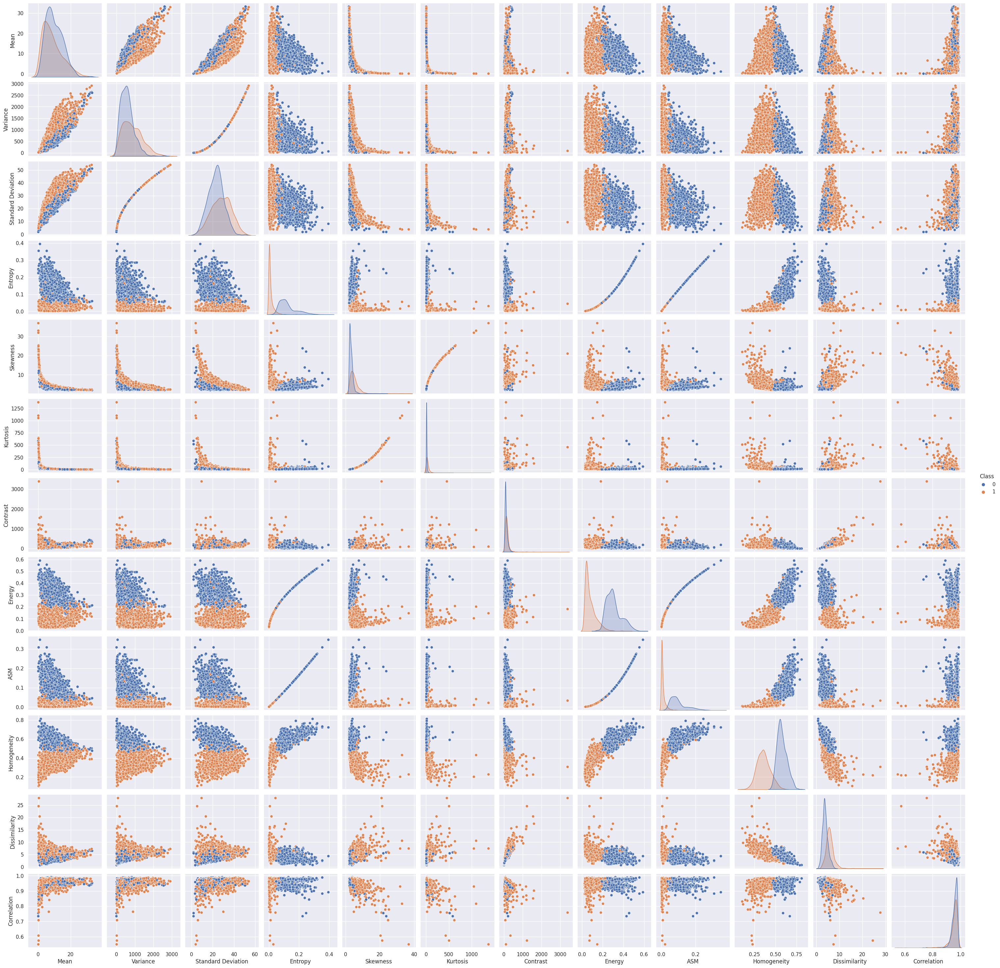

In [9]:
sns.pairplot(df, hue='Class')
plt.show()

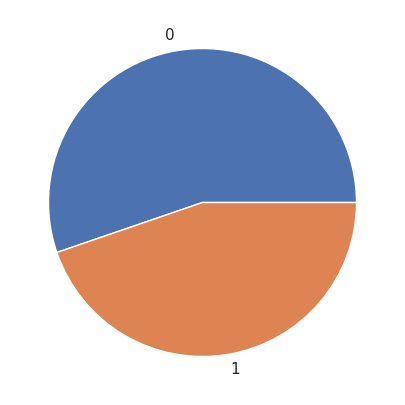

In [11]:
y =df['Class']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

**Data Matrix**

In [15]:
X = df.drop(columns=['Class','Image'])
X.head(10)

,Mean,Variance,Standard Deviation,Entropy,Skewness,Kurtosis,Contrast,Energy,ASM,Homogeneity,Dissimilarity,Correlation
0,6.535339,619.587845,24.891522,0.109059,4.276477,18.900575,98.613971,0.293314,0.086033,0.530941,4.473346,0.981939
1,8.749969,805.957634,28.389393,0.266538,3.718116,14.464618,63.858816,0.475051,0.225674,0.651352,3.220072,0.988834
2,7.341095,1143.808219,33.820234,0.001467,5.061750,26.479563,81.867206,0.031917,0.001019,0.268275,5.981800,0.978014
3,5.958145,959.711985,30.979219,0.001477,5.677977,33.428845,151.229741,0.032024,0.001026,0.243851,7.700919,0.964189
4,7.315231,729.540579,27.010009,0.146761,4.283221,19.079108,174.988756,0.343849,0.118232,0.501140,6.834689,0.972789
5,7.524109,607.395258,24.645390,0.214086,3.729886,14.471736,105.077882,0.421587,0.177736,0.598169,4.193146,0.976485
6,12.304413,922.746138,30.376737,0.128833,2.930095,8.969348,115.203118,0.320675,0.102832,0.532292,4.880320,0.974745
7,15.929474,1069.950248,32.710094,0.107658,2.484002,6.515889,94.874288,0.291321,0.084868,0.532262,4.242054,0.976774
8,19.921616,1166.120922,34.148513,0.094975,2.129173,4.905844,93.818920,0.272486,0.074248,0.526644,4.027167,0.974310
9,8.476196,1095.785127,33.102645,0.003002,4.365000,19.682514,72.588783,0.045685,0.002087,0.361432,4.590795,0.967830


In [16]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Mean,3762.0,9.488890,5.728022,0.078659,4.982395,8.477531,13.212723,33.239975
Variance,3762.0,711.101063,467.466896,3.145628,363.225459,622.580417,966.954319,2910.581879
Standard Deviation,3762.0,25.182271,8.773526,1.773592,19.058475,24.951560,31.095889,53.949809
Entropy,3762.0,0.073603,0.070269,0.000882,0.006856,0.066628,0.113284,0.394539
Skewness,3762.0,4.102727,2.560940,1.886014,2.620203,3.422210,4.651737,36.931294
Kurtosis,3762.0,24.389071,56.434747,3.942402,7.252852,12.359088,22.640304,1371.640060
Contrast,3762.0,127.961459,109.499601,3.194733,72.125208,106.737418,161.059006,3382.574163
Energy,3762.0,0.204705,0.129352,0.024731,0.069617,0.225496,0.298901,0.589682
ASM,3762.0,0.058632,0.058300,0.000612,0.004847,0.050849,0.089342,0.347725
Homogeneity,3762.0,0.479252,0.127929,0.105490,0.364973,0.512551,0.575557,0.810921


**Standardize the Data**

In [17]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,Mean,Variance,Standard Deviation,Entropy,Skewness,Kurtosis,Contrast,Energy,ASM,Homogeneity,Dissimilarity,Correlation
0,-0.515700,-0.195790,-0.033144,0.504650,0.067855,-0.097267,-0.268050,0.685118,0.470073,0.404100,-0.121709,1.000713
1,-0.129018,0.202943,0.365594,2.746050,-0.150204,-0.175881,-0.585492,2.090287,2.865580,1.345457,-0.799181,1.264377
2,-0.375013,0.925765,0.984680,-1.026708,0.374531,0.037048,-0.421010,-1.335981,-0.988340,-1.649391,0.693704,0.850636
3,-0.616481,0.531896,0.660820,-1.026561,0.615188,0.160202,0.212525,-1.335154,-0.988223,-1.840334,1.622995,0.322041
4,-0.379529,0.039451,0.208352,1.041256,0.070489,-0.094103,0.429532,1.075849,1.022442,0.171115,1.154744,0.650854
5,-0.343058,-0.221876,-0.061201,1.999492,-0.145607,-0.175754,-0.209011,1.676911,2.043216,0.929680,-0.273174,0.792183
6,0.491600,0.452809,0.592140,0.786094,-0.457952,-0.273267,-0.116530,0.896663,0.758254,0.414664,0.098286,0.725663
7,1.124549,0.767748,0.858130,0.484704,-0.632166,-0.316747,-0.302207,0.669707,0.450084,0.414424,-0.246736,0.803243
8,1.821591,0.973503,1.022101,0.304199,-0.770739,-0.345280,-0.311847,0.524073,0.267905,0.370503,-0.362896,0.709033
9,-0.176820,0.823021,0.902878,-1.004859,0.102426,-0.083409,-0.505756,-1.229526,-0.970011,-0.921103,-0.058220,0.461240


In [18]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Mean,3762.0,-2.285371e-16,1.000133,-1.643060,-0.786850,-0.176587,0.650194,4.147024
Variance,3762.0,0.000000e+00,1.000133,-1.514652,-0.744271,-0.189388,0.547391,4.705730
Standard Deviation,3762.0,2.568682e-16,1.000133,-2.668459,-0.698079,-0.026300,0.674119,3.279339
Entropy,3762.0,-1.510989e-17,1.000133,-1.035037,-0.949997,-0.099269,0.564790,4.567876
Skewness,3762.0,6.043957e-17,1.000133,-0.865701,-0.578975,-0.265765,0.214407,12.820657
Kurtosis,3762.0,2.266484e-17,1.000133,-0.362355,-0.303687,-0.213195,-0.030992,23.875895
Contrast,3762.0,5.666210e-17,1.000133,-1.139578,-0.509990,-0.193853,0.302302,29.726550
Energy,3762.0,2.719781e-16,1.000133,-1.391539,-1.044483,0.160757,0.728316,2.976598
ASM,3762.0,1.359890e-16,1.000133,-0.995323,-0.922673,-0.133515,0.526833,4.959343
Homogeneity,3762.0,3.928572e-16,1.000133,-2.922023,-0.893420,0.260329,0.752898,2.592945


**Observations and variables**

In [19]:
observations = list(df.index)
variables = list(df.columns)

**Box and Whisker Plots**

(-12.0, 12.0)

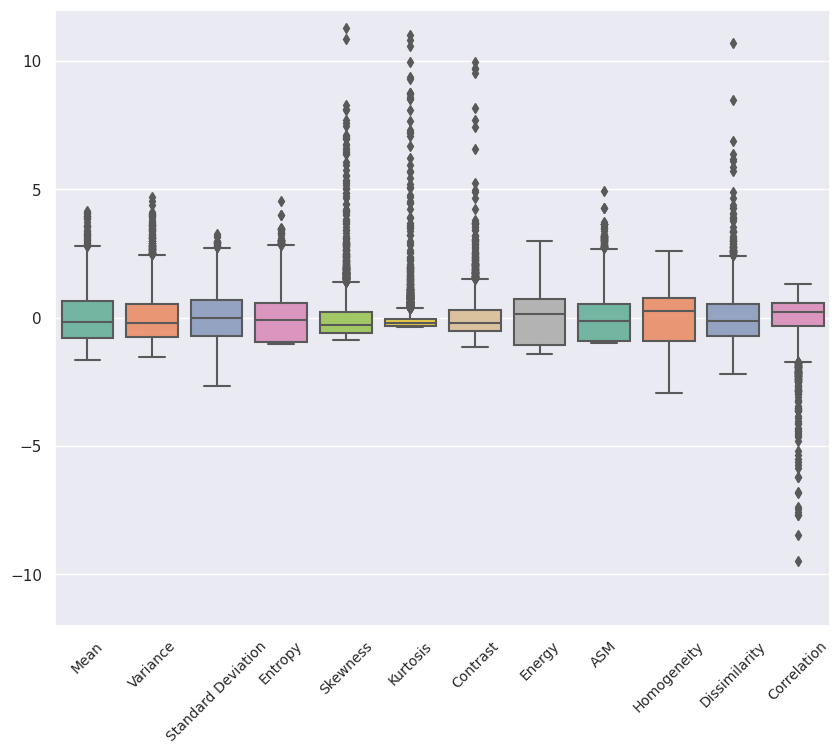

In [21]:
ax = plt.figure(figsize=(10, 8))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45, fontsize=10);

# setting y-axis limits for clearer graph
ax.set_ylim(-12, 12) 

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:.25'` for same effect.
  warnings.warn(msg, FutureWarning)


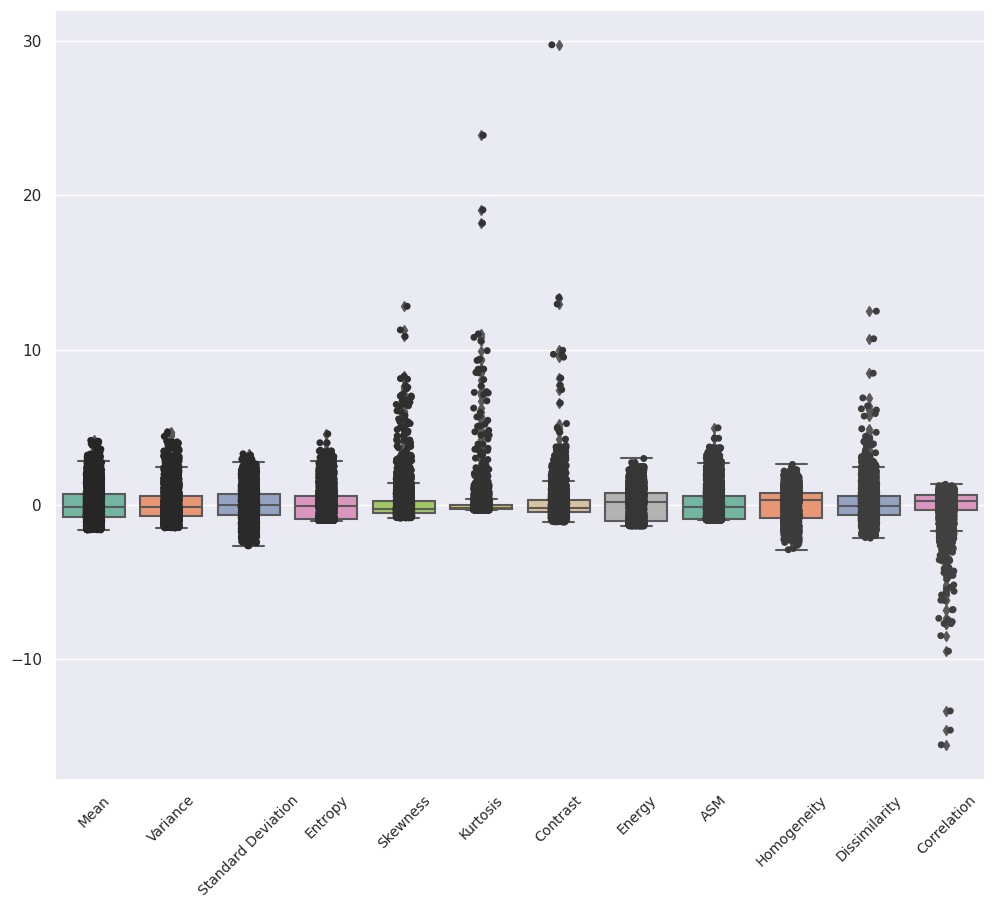

In [22]:
# Use swarmplot() or stripplot to show the datapoints on top of the boxes:
#plt. figure()

ax = plt.figure(figsize=(12, 10))    
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25") 
ax.set_xticklabels(ax.get_xticklabels(),rotation=45, fontsize=10);

**Correlation Matrix**

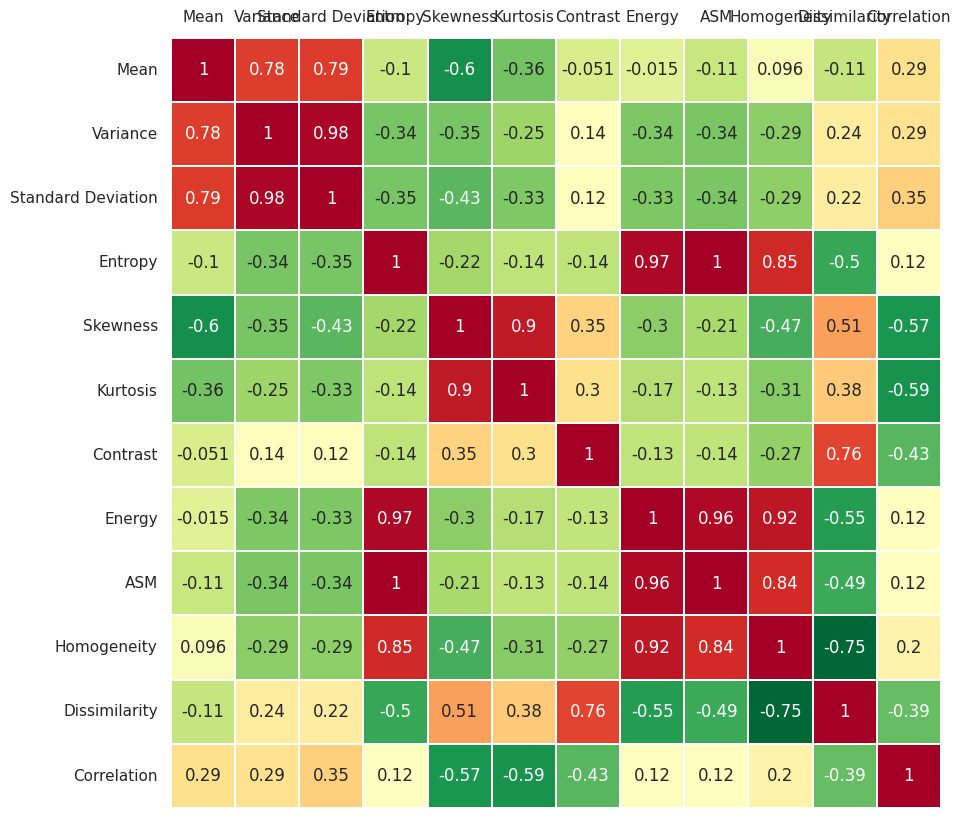

In [23]:
fig1,ax1 = plt.subplots(figsize=(15,10))
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.3, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

#X.corr().style.background_gradient(cmap='coolwarm').set_precision(2)
#sns.clustermap(X.corr(), annot=True, fmt='.2f')

# **Principal Component Analysis (PCA)**

Text(0, 0.5, '$Z_2$')

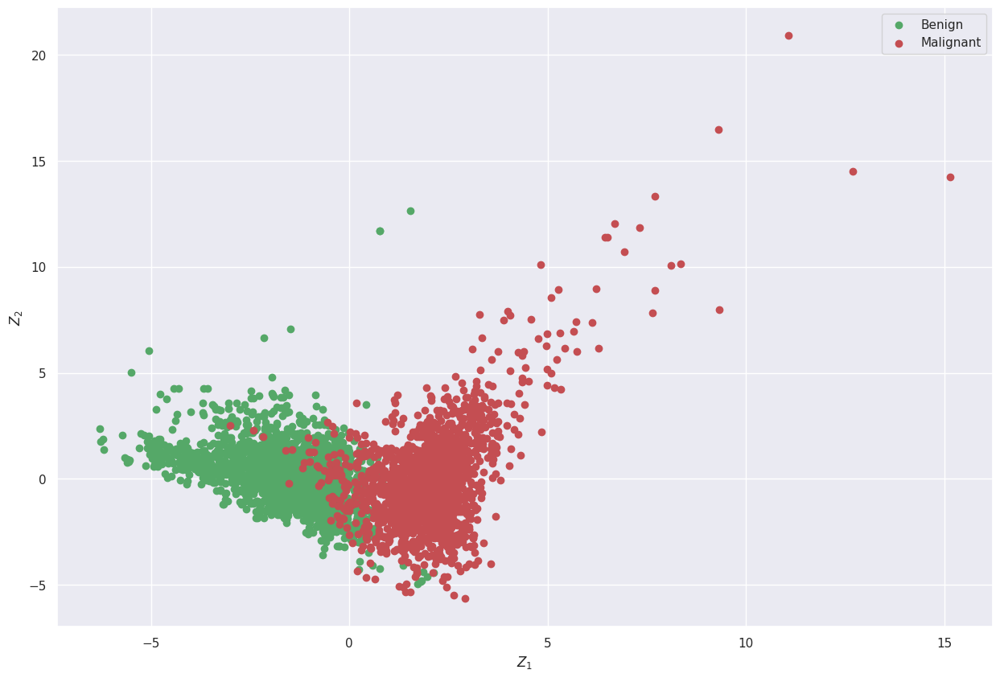

In [24]:
pca = PCA()
Z = pca.fit_transform(X)

# (Malignant)->1,  (Benign)->0

idx_Benign= np.where(y == 0)
idx_Malignant = np.where(y == 1)


plt. figure(figsize=(15,10))
plt.scatter(Z[idx_Benign,0], Z[idx_Benign,1], c='g', label='Benign')
plt.scatter(Z[idx_Malignant,0], Z[idx_Malignant,1], c='r', label='Malignant')


plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')

**Eigenvectors**

array([[-1.36943174e-03, -4.29053945e-01,  2.54168149e-01,
         3.80815552e-01, -2.39604973e-01,  2.66155771e-01,
        -5.89278264e-01, -3.36859675e-01, -9.60416311e-02,
         1.13880660e-02, -8.90601712e-02, -5.54591440e-03],
       [ 1.60192825e-01, -4.20574153e-01,  2.74990715e-01,
         2.25068392e-01,  1.62014900e-01, -2.14102548e-01,
         4.04552866e-01, -6.15755869e-03, -3.33629783e-01,
         3.53467858e-01,  4.46201243e-01,  6.81121507e-03],
       [ 1.49575575e-01, -4.44042821e-01,  2.46728233e-01,
         1.28698555e-01,  1.61386185e-01, -1.99132152e-01,
         2.50215050e-01,  2.05643795e-01,  3.07294499e-01,
        -4.73068766e-01, -4.62750284e-01, -7.55869305e-03],
       [-4.02581652e-01,  1.09882624e-01,  2.78138676e-01,
         4.32420068e-03,  1.89074137e-01, -2.64303270e-01,
        -7.02753850e-02, -1.55125392e-01,  1.50153800e-01,
         1.49082968e-01, -5.37319595e-02, -7.52467419e-01],
       [ 2.26439002e-01,  4.00628919e-01,  5.0999362

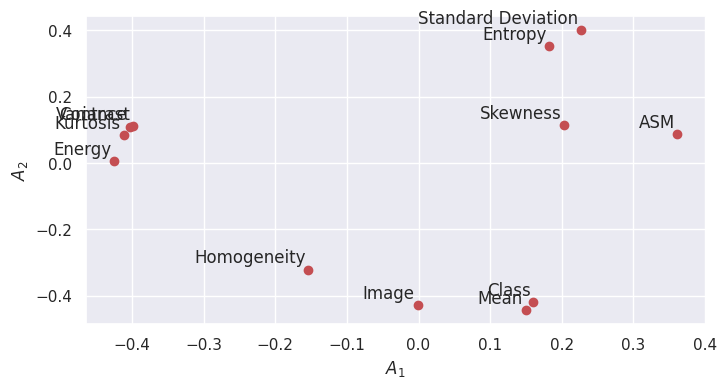

In [25]:
A = pca.components_.T 
plt. figure(figsize=(8,4))

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')
A

/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


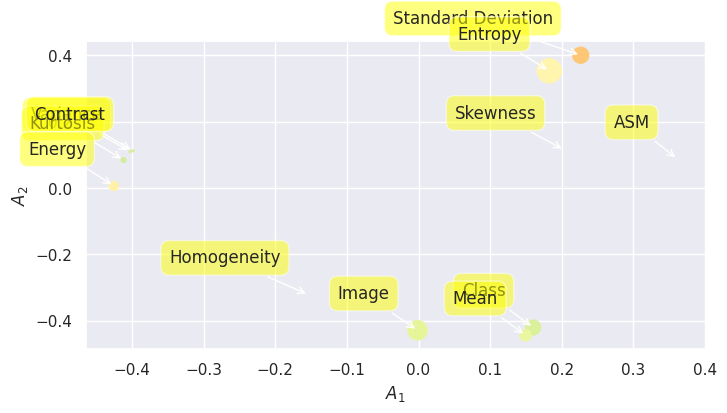

In [26]:
plt. figure(figsize=(8,4))
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

**Scree plot**

array([4.90710566e+00, 3.75689637e+00, 1.54532242e+00, 7.51981437e-01,
       5.74289358e-01, 2.40128855e-01, 1.29225878e-01, 4.01238990e-02,
       3.06448213e-02, 1.67032410e-02, 1.07042171e-02, 6.44871526e-05])

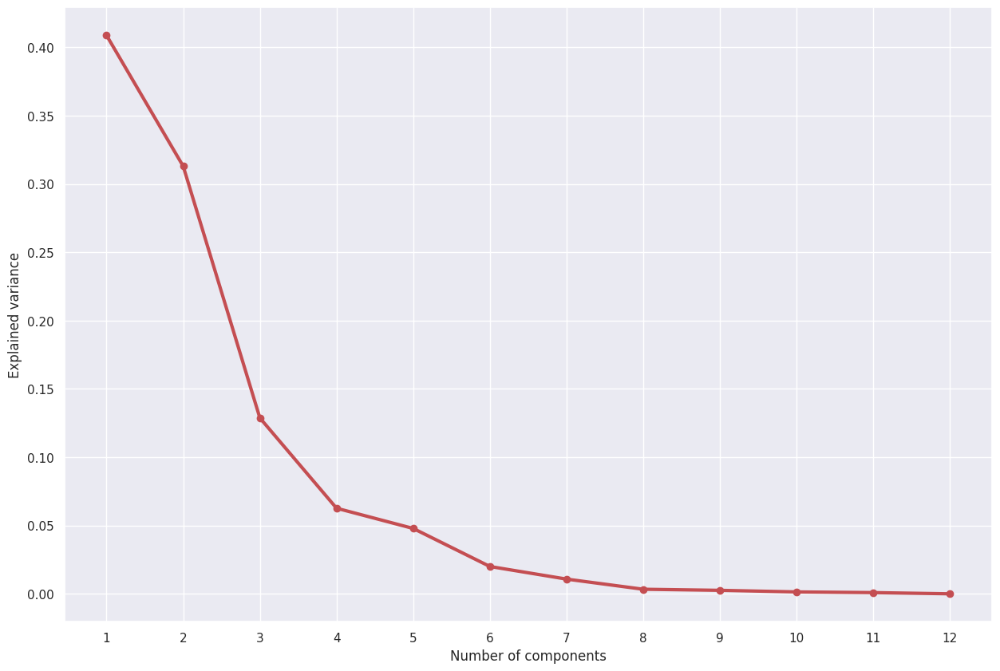

In [27]:
#Eigenvalues
Lambda = pca.explained_variance_ 

#Scree plot
x = np.arange(len(Lambda)) + 1
plt. figure(figsize=(15,10))
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
Lambda

**Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

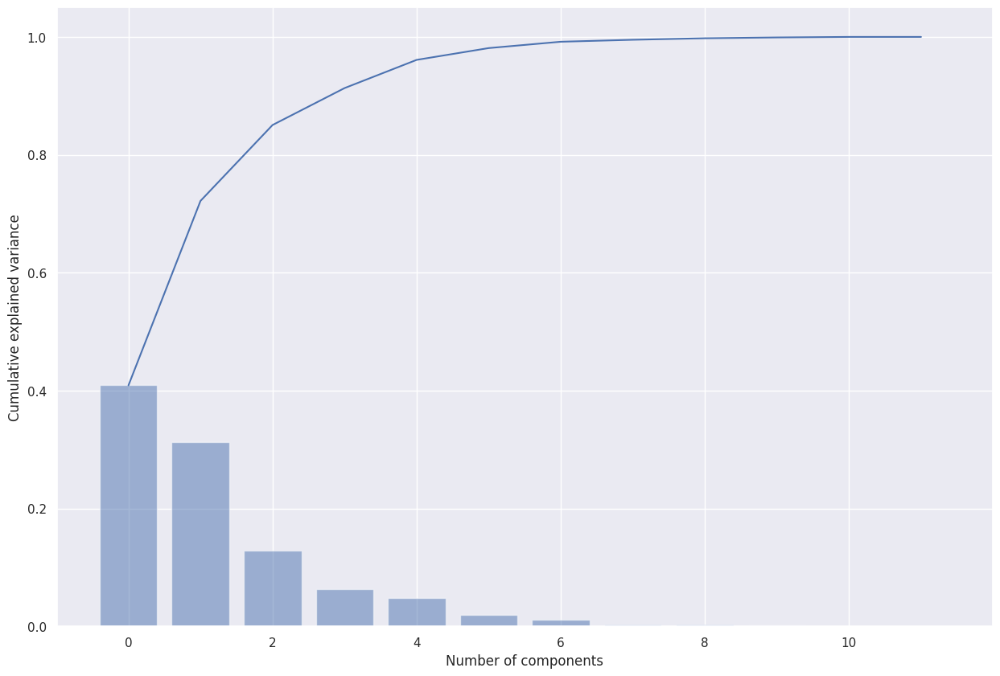

In [28]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt. figure(figsize=(15,10))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

**Biplot**

array([ 0.11653928, -0.04943709, -1.11144579, ..., -1.77566409,
       -0.65503372,  1.21326935])

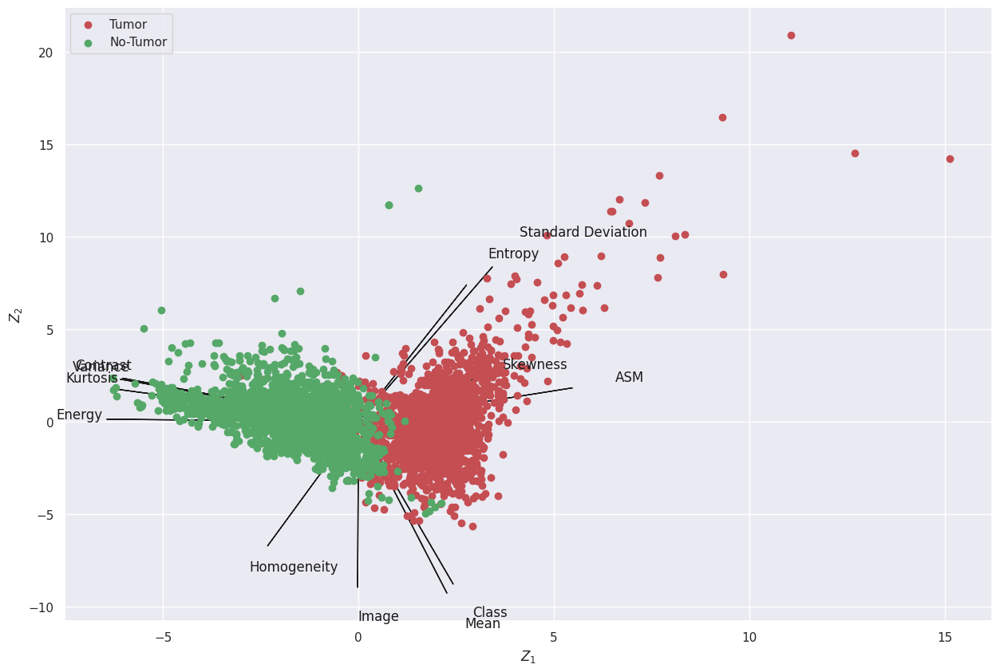

In [29]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0] 
A2 = A[:,1]
Z1 = Z[:,0] 
Z2 = Z[:,1]

plt. figure(figsize=(15,10))
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_Malignant,0], Z[idx_Malignant,1], c='r', label='Tumor')
plt.scatter(Z[idx_Benign,0], Z[idx_Benign,1], c='g', label='No-Tumor')

plt.legend(loc='upper left')
Z1
Z2

# **Using PCA Library**

In [30]:
!pip install pca

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [31]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [12] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [5] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [12] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[5]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


**Principal Components**

In [32]:
out['PC']

,PC1,PC2,PC3,PC4,PC5
0,-1.134947,0.116539,-0.122074,-0.306272,0.987701
1,-4.262143,-0.049437,1.500706,0.313062,1.862962
2,2.481383,-1.111446,-0.957833,-0.117939,1.167254
3,3.074085,-0.235259,-0.388747,-0.687068,0.955671
4,-0.900927,0.311275,1.345354,-0.830260,1.192911
...,...,...,...,...,...
3757,0.321001,-2.161311,1.250400,0.579057,-0.689392
3758,0.205905,-2.131569,1.261261,0.556632,-0.602184
3759,0.203598,-1.775664,1.133058,0.338989,-0.514559
3760,0.273145,-0.655034,1.593303,-0.421314,-0.494440


**Scatter plot**

[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '5 Principal Components explain [98.10%] of the variance'}, xlabel='PC1 (40.8% expl.var)', ylabel='PC2 (31.2% expl.var)'>)

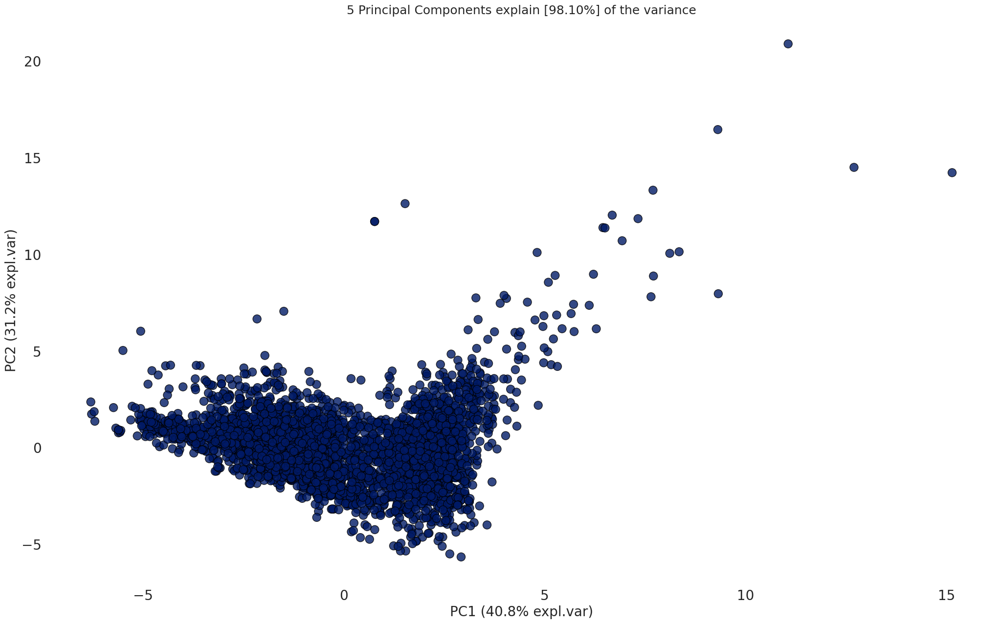

In [33]:
model.scatter(label=True, legend=False)

**Eigenvectors**

In [34]:
A = out['loadings'].T
A

,PC1,PC2,PC3,PC4,PC5
Mean,-0.001369,-0.429054,0.254168,0.380816,-0.239605
Variance,0.160193,-0.420574,0.274991,0.225068,0.162015
Standard Deviation,0.149576,-0.444043,0.246728,0.128699,0.161386
Entropy,-0.402582,0.109883,0.278139,0.004324,0.189074
Skewness,0.226439,0.400629,0.050999,0.263507,0.350233
Kurtosis,0.182659,0.353641,0.148538,0.598108,0.242535
Contrast,0.203486,0.115284,0.591056,-0.426392,-0.082716
Energy,-0.411848,0.084626,0.283550,0.022367,0.048474
ASM,-0.398584,0.112420,0.278547,0.003185,0.210870
Homogeneity,-0.425474,0.006314,0.137114,0.084156,-0.193046


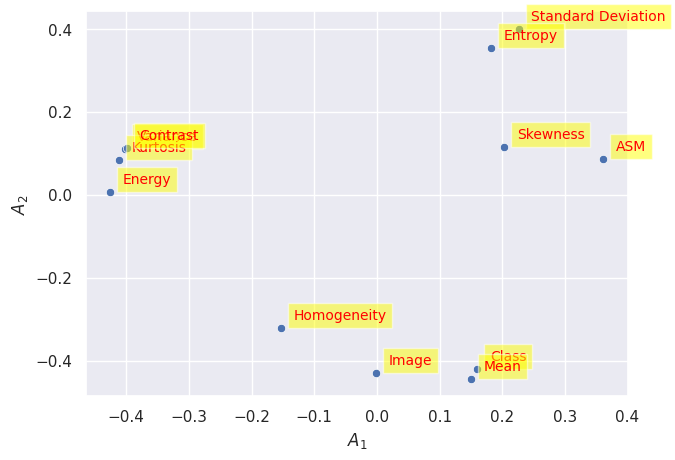

In [35]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))
 

**Scree Plot**

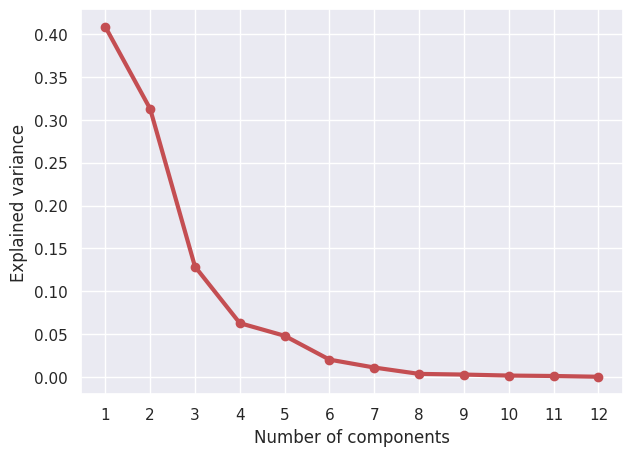

In [36]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 
plt.show()

**Explained Variance Plot**

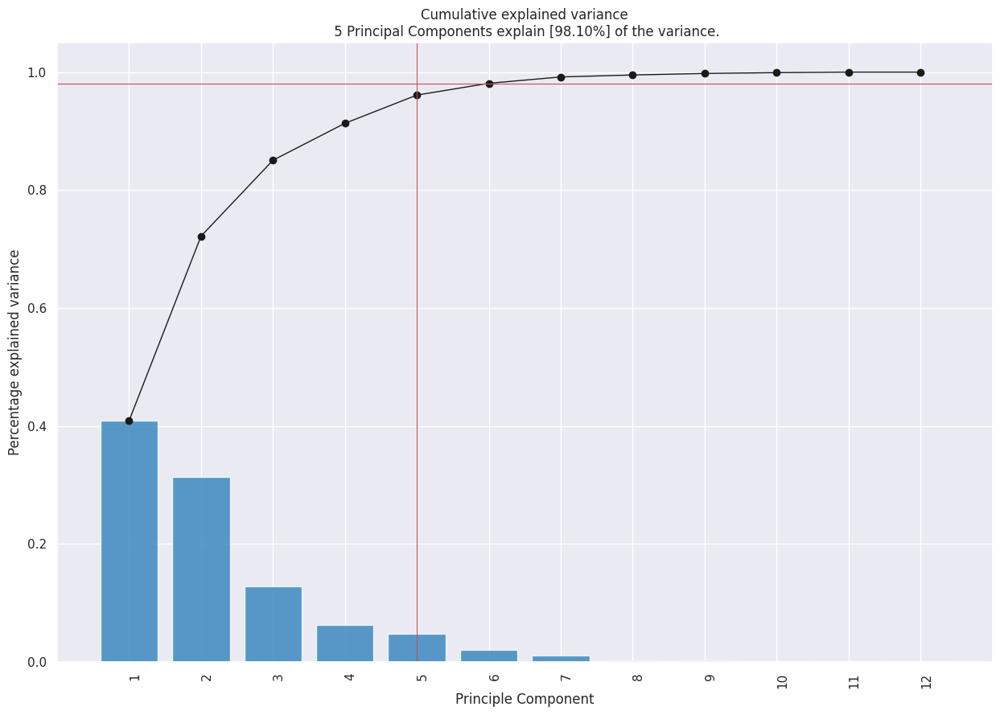

<Figure size 700x500 with 0 Axes>

In [37]:
model.plot();

**Biplot**

[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.


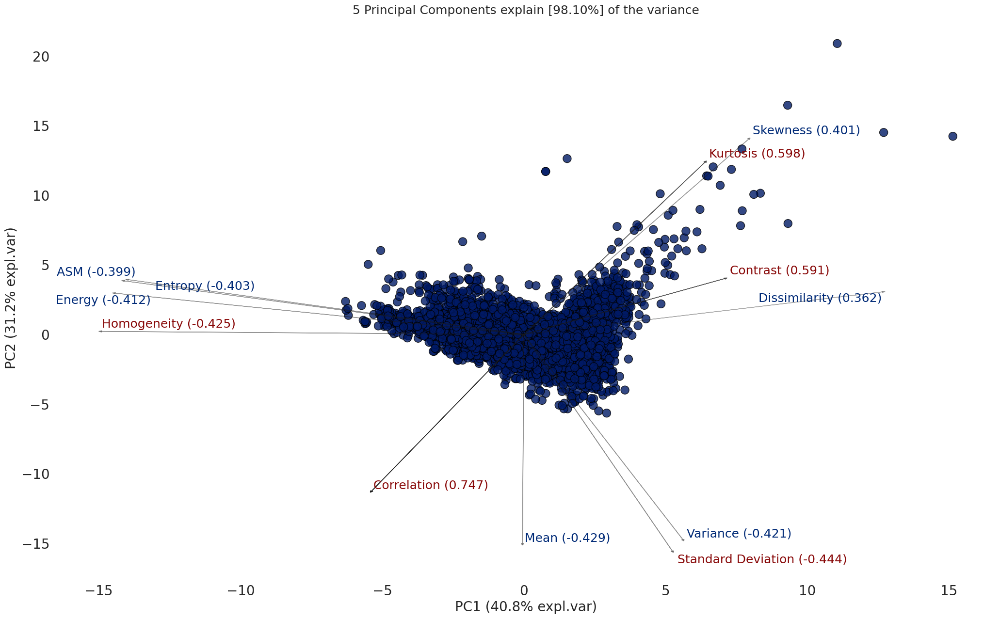

(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '5 Principal Components explain [98.10%] of the variance'}, xlabel='PC1 (40.8% expl.var)', ylabel='PC2 (31.2% expl.var)'>)

In [38]:
model.biplot(label=False, legend=False, color_arrow='k')

[pca] >Plot PC1 vs PC2 vs PC3 with loadings.


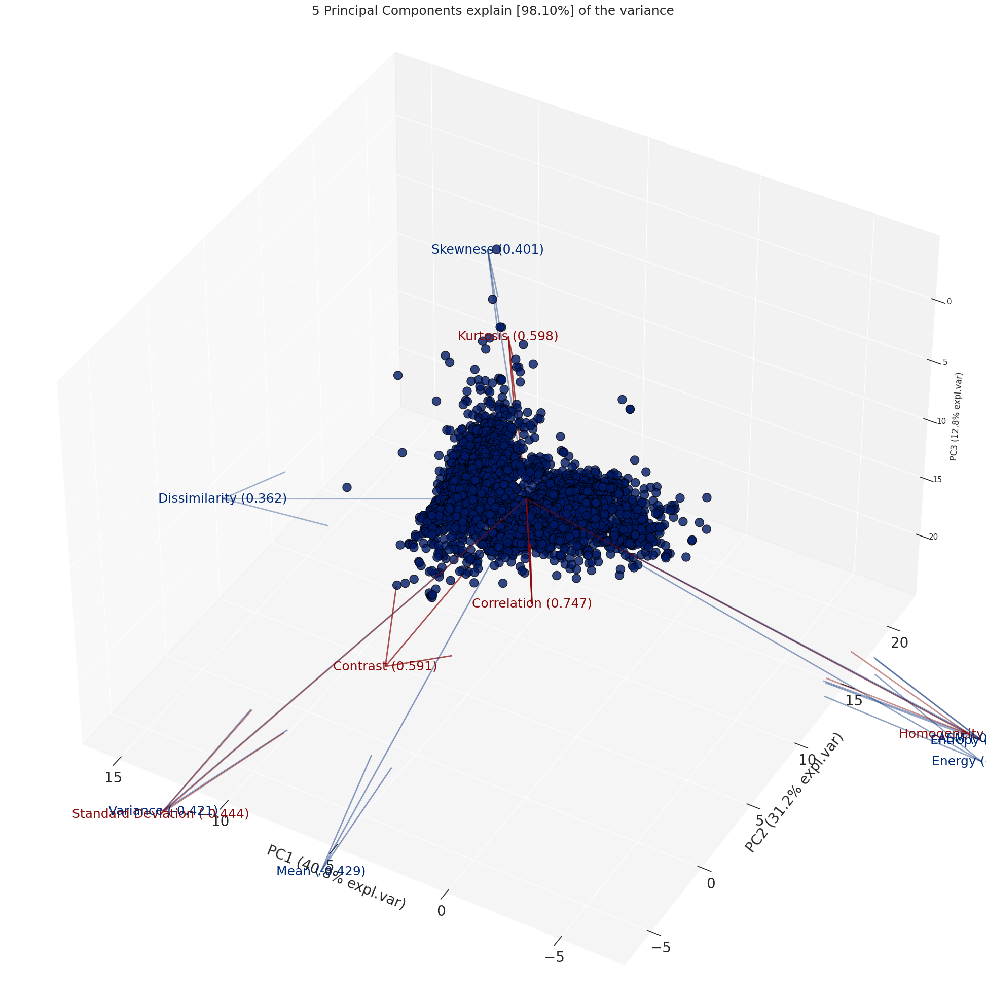

(<Figure size 3000x2500 with 1 Axes>,
 <Axes3D: title={'center': '5 Principal Components explain [98.10%] of the variance'}, xlabel='PC1 (40.8% expl.var)', ylabel='PC2 (31.2% expl.var)', zlabel='PC3 (12.8% expl.var)'>)

In [39]:
model.biplot3d(legend=False)

# Classification using Pycaret
At first dataset is split into train and test set with 70% and 30% ratio respectively. Then using the PyCaret compare_models() function, the models which shows the highest accuracy on the original dataset can be found. 
Before applying PCA, the output from compare_models() function shows that Linear Discriminant Analayis, Extra Trees Classifier, and Gradient Boosting Classifier shows the best performance.

 However, after applying PCA, the these models performance decreases and Logistic Regression, K-nearest neighbour, and Quadratic Discriminant Analysis shows the highest performance. Therefore, I have taken Logistic Regression, K-nearest Neighbour and Quadratic discriminant Analysis as my classification algorithms and applied these three models on the original dataset before applying PCA and after applying PCA.

In [40]:
#Run the below code in your notebook to check the installed version
from pycaret.utils import version
version()

'3.0.0'

In [42]:
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)
#dr = df.drop(columns=['id'])

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (3386, 14)
Unseen Data For Predictions: (376, 14)


In [44]:
from pycaret.classification import *
clf = setup(data=data, target='Class', train_size=0.7, session_id=123)

,Description,Value
0,Session id,123
1,Target,Class
2,Target type,Binary
3,Original data shape,"(3386, 14)"
4,Transformed data shape,"(3386, 14)"
5,Transformed train set shape,"(2370, 14)"
6,Transformed test set shape,"(1016, 14)"
7,Numeric features,12
8,Categorical features,1
9,Preprocess,True


**Comparing All Models**

In [46]:
#show the best model and their statistics
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
xgboost,Extreme Gradient Boosting,0.9899,0.9981,0.9830,0.9944,0.9886,0.9795,0.9796,0.3490
lightgbm,Light Gradient Boosting Machine,0.9886,0.9983,0.9811,0.9934,0.9872,0.9769,0.9771,0.4860
ada,Ada Boost Classifier,0.9878,0.9973,0.9811,0.9915,0.9863,0.9752,0.9753,0.5920
rf,Random Forest Classifier,0.9873,0.9978,0.9764,0.9952,0.9857,0.9743,0.9746,0.5730
gbc,Gradient Boosting Classifier,0.9861,0.9980,0.9764,0.9925,0.9843,0.9718,0.9720,0.8160
et,Extra Trees Classifier,0.9861,0.9988,0.9764,0.9924,0.9843,0.9718,0.9720,0.5330
dt,Decision Tree Classifier,0.9831,0.9826,0.9774,0.9848,0.9810,0.9658,0.9660,0.2500
qda,Quadratic Discriminant Analysis,0.9759,0.9930,0.9660,0.9803,0.9729,0.9513,0.9517,0.1320
lda,Linear Discriminant Analysis,0.9717,0.9950,0.9415,0.9951,0.9675,0.9425,0.9437,0.2380
lr,Logistic Regression,0.9671,0.9941,0.9358,0.9902,0.9620,0.9330,0.9345,0.5000


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [47]:
best_model

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=-1, num_parallel_tree=None,
              objective='binary:logistic', predictor=None, ...)

 Create a Model

**Logistic Regresssion**

In [48]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9620,0.9939,0.9340,0.9802,0.9565,0.9228,0.9237
1,0.9789,0.9985,0.9528,1.0000,0.9758,0.9571,0.9580
2,0.9747,0.9986,0.9434,1.0000,0.9709,0.9485,0.9498
3,0.9662,0.9957,0.9245,1.0000,0.9608,0.9312,0.9334
4,0.9747,0.9957,0.9623,0.9808,0.9714,0.9487,0.9488
5,0.9705,0.9815,0.9434,0.9901,0.9662,0.9400,0.9409
6,0.9705,0.9943,0.9340,1.0000,0.9659,0.9399,0.9416
7,0.9705,0.9983,0.9434,0.9901,0.9662,0.9400,0.9409
8,0.9662,0.9929,0.9528,0.9712,0.9619,0.9316,0.9317


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

**Tune the model**

In [49]:
tuned_lr=tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9873,0.9978,0.9811,0.9905,0.9858,0.9744,0.9744
1,0.9873,0.9981,0.9717,1.0000,0.9856,0.9743,0.9747
2,0.9789,0.9995,0.9528,1.0000,0.9758,0.9571,0.9580
3,0.9831,0.9933,0.9623,1.0000,0.9808,0.9657,0.9663
4,0.9789,0.9949,0.9623,0.9903,0.9761,0.9572,0.9575
5,0.9873,0.9949,0.9811,0.9905,0.9858,0.9744,0.9744
6,0.9873,0.9950,0.9717,1.0000,0.9856,0.9743,0.9747
7,0.9916,0.9997,0.9906,0.9906,0.9906,0.9829,0.9829
8,0.9789,0.9958,0.9811,0.9720,0.9765,0.9574,0.9574


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [50]:
tuned_lr

LogisticRegression(C=8.866, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

**Evaluate Logistic Regression**


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

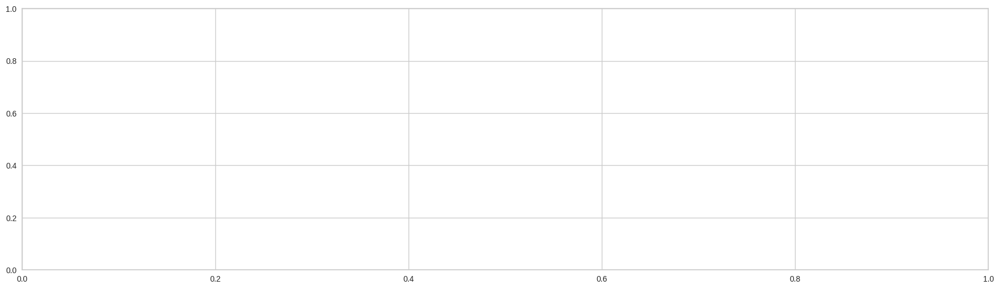

In [53]:
evaluate_model(tuned_lr)

**Create model with K-nearest neighbour**

In [52]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7722,0.8469,0.7075,0.7653,0.7353,0.5358,0.5371
1,0.8228,0.8849,0.7830,0.8137,0.7981,0.6403,0.6407
2,0.8186,0.8584,0.7170,0.8539,0.7795,0.6273,0.6343
3,0.7975,0.8716,0.7642,0.7788,0.7714,0.5896,0.5897
4,0.8186,0.8893,0.7736,0.8119,0.7923,0.6314,0.6320
5,0.8228,0.8954,0.7547,0.8333,0.7921,0.6383,0.6407
6,0.7890,0.8798,0.6509,0.8415,0.7340,0.5639,0.5767
7,0.8059,0.9027,0.6792,0.8571,0.7579,0.5995,0.6108
8,0.8312,0.8772,0.8019,0.8173,0.8095,0.6580,0.6581


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

**Tune model with K-nearest neighbour**

In [ ]:
tuned_knn = tune_model(knn)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8889,0.9545,1.0000,0.8462,0.9167,0.7534,0.7774
1,0.8611,0.8929,1.0000,0.8148,0.8980,0.6875,0.7237
2,0.8889,0.8896,0.9545,0.8750,0.9130,0.7600,0.7655
3,0.9167,1.0000,1.0000,0.8800,0.9362,0.8176,0.8315
4,0.9444,0.9692,0.9091,1.0000,0.9524,0.8861,0.8919
5,0.9167,0.9675,1.0000,0.8800,0.9362,0.8176,0.8315
6,0.8333,0.9143,0.9048,0.8261,0.8636,0.6505,0.6549
7,0.9444,0.9810,0.9524,0.9524,0.9524,0.8857,0.8857
8,0.8571,0.8605,0.9048,0.8636,0.8837,0.6988,0.7001
9,0.8857,0.9660,1.0000,0.8400,0.9130,0.7500,0.7746


In [ ]:
tuned_knn

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=29, p=2,
                     weights='distance')

**Evaluate model with K-nearest neighbour**

In [ ]:
evaluate_model(tuned_knn)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create model with Quadratic Discriminant Analysis**

In [ ]:
qda=create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8889,0.9773,1.0000,0.8462,0.9167,0.7534,0.7774
1,0.9167,0.9448,1.0000,0.8800,0.9362,0.8176,0.8315
2,0.9167,0.9513,1.0000,0.8800,0.9362,0.8176,0.8315
3,0.9444,1.0000,1.0000,0.9167,0.9565,0.8800,0.8864
4,0.9444,0.9805,0.9091,1.0000,0.9524,0.8861,0.8919
5,0.9167,1.0000,1.0000,0.8800,0.9362,0.8176,0.8315
6,0.9167,0.9778,0.9524,0.9091,0.9302,0.8269,0.8283
7,0.9722,0.9937,0.9524,1.0000,0.9756,0.9434,0.9449
8,0.8286,0.9286,0.9524,0.8000,0.8696,0.6250,0.6455
9,0.8857,1.0000,1.0000,0.8400,0.9130,0.7500,0.7746


**Tune QDA Model**

In [ ]:
tuned_qda=tune_model(qda)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8611,0.9643,1.0000,0.8148,0.8980,0.6875,0.7237
1,0.8333,0.9318,0.8636,0.8636,0.8636,0.6494,0.6494
2,0.8889,0.9416,0.9545,0.8750,0.9130,0.7600,0.7655
3,0.9444,0.9903,1.0000,0.9167,0.9565,0.8800,0.8864
4,0.8889,0.9805,0.8182,1.0000,0.9000,0.7778,0.7977
5,0.9167,0.9968,1.0000,0.8800,0.9362,0.8176,0.8315
6,0.8889,0.9810,0.9524,0.8696,0.9091,0.7670,0.7722
7,0.9167,0.9841,0.9048,0.9500,0.9268,0.8302,0.8315
8,0.8857,0.9218,0.9524,0.8696,0.9091,0.7561,0.7618
9,0.8857,0.9966,1.0000,0.8400,0.9130,0.7500,0.7746


**Evaluate QDA Model**

In [ ]:
tuned_qda

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.17,
                              store_covariance=False, tol=0.0001)

In [ ]:
evaluate_model(tuned_qda)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [ ]:
!pip install statsmodels --upgrade

# **Classification + PCA**

In [ ]:
clf_pca = setup(data=data, target='diagnosis', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,session_id,123
1,Target,diagnosis
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(512, 6)"
5,Missing Values,False
6,Numeric Features,5
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


# **Comparing Models**

In [ ]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9300,0.9852,0.9535,0.9349,0.9427,0.8523,0.8565,0.035
knn,K Neighbors Classifier,0.9161,0.9591,0.9537,0.9155,0.9326,0.8213,0.8277,0.141
qda,Quadratic Discriminant Analysis,0.9160,0.9823,0.9580,0.9125,0.9326,0.8209,0.8289,0.022
et,Extra Trees Classifier,0.9134,0.9708,0.9491,0.9147,0.9297,0.8164,0.8238,0.490
nb,Naive Bayes,0.9133,0.9769,0.9539,0.9117,0.9308,0.8148,0.8213,0.019
gbc,Gradient Boosting Classifier,0.9132,0.9695,0.9351,0.9273,0.9286,0.8171,0.8241,0.108
svm,SVM - Linear Kernel,0.9106,0.0000,0.9400,0.9183,0.9275,0.8105,0.8151,0.027
ridge,Ridge Classifier,0.9106,0.0000,0.9907,0.8828,0.9318,0.8036,0.8217,0.016
rf,Random Forest Classifier,0.9106,0.9714,0.9353,0.9210,0.9265,0.8120,0.8168,0.562
lightgbm,Light Gradient Boosting Machine,0.9106,0.9604,0.9305,0.9263,0.9260,0.8123,0.8190,0.053


# **Best model with PCA**

In [ ]:
best_model_pca

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

# **Tune Best Model**

In [ ]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8889,0.9773,0.9545,0.8750,0.9130,0.7600,0.7655
1,0.8889,0.9578,0.9545,0.8750,0.9130,0.7600,0.7655
2,0.9444,0.9643,1.0000,0.9167,0.9565,0.8800,0.8864
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,0.9444,1.0000,0.9091,1.0000,0.9524,0.8861,0.8919
5,0.9444,0.9968,1.0000,0.9167,0.9565,0.8800,0.8864
6,0.9722,0.9968,1.0000,0.9545,0.9767,0.9423,0.9439
7,0.9167,1.0000,0.8571,1.0000,0.9231,0.8333,0.8452
8,0.9429,0.9626,0.9524,0.9524,0.9524,0.8810,0.8810
9,0.9429,0.9966,1.0000,0.9130,0.9545,0.8780,0.8847


# **Evaluate Best Model**

In [ ]:
evaluate_model(tuned_best_model_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [ ]:
lr_pca = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9167,0.9805,0.9545,0.9130,0.9333,0.8224,0.8238
1,0.8889,0.9610,0.9545,0.8750,0.9130,0.7600,0.7655
2,0.9444,0.9643,1.0000,0.9167,0.9565,0.8800,0.8864
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,0.9444,0.9968,0.9091,1.0000,0.9524,0.8861,0.8919
5,0.9167,0.9903,0.9545,0.9130,0.9333,0.8224,0.8238
6,0.9722,0.9968,1.0000,0.9545,0.9767,0.9423,0.9439
7,0.9167,1.0000,0.8571,1.0000,0.9231,0.8333,0.8452
8,0.8571,0.9626,0.9048,0.8636,0.8837,0.6988,0.7001
9,0.9429,1.0000,1.0000,0.9130,0.9545,0.8780,0.8847


# **Tune Model**

In [ ]:
tuned_lr_pca = tune_model(lr_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8889,0.9773,0.9545,0.8750,0.9130,0.7600,0.7655
1,0.8889,0.9578,0.9545,0.8750,0.9130,0.7600,0.7655
2,0.9444,0.9643,1.0000,0.9167,0.9565,0.8800,0.8864
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,0.9444,1.0000,0.9091,1.0000,0.9524,0.8861,0.8919
5,0.9444,0.9968,1.0000,0.9167,0.9565,0.8800,0.8864
6,0.9722,0.9968,1.0000,0.9545,0.9767,0.9423,0.9439
7,0.9167,1.0000,0.8571,1.0000,0.9231,0.8333,0.8452
8,0.9429,0.9626,0.9524,0.9524,0.9524,0.8810,0.8810
9,0.9429,0.9966,1.0000,0.9130,0.9545,0.8780,0.8847


# **Evaluate Model**

In [ ]:
tuned_lr_pca

LogisticRegression(C=0.049, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
evaluate_model(tuned_lr_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **Create K-nearest neighbour Model**

In [ ]:
knn_pca = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8611,0.9594,0.9545,0.8400,0.8936,0.6959,0.7078
1,0.8889,0.9156,1.0000,0.8462,0.9167,0.7534,0.7774
2,0.8889,0.9383,0.9091,0.9091,0.9091,0.7662,0.7662
3,0.9722,0.9578,1.0000,0.9565,0.9778,0.9408,0.9424
4,0.9444,0.9968,0.9091,1.0000,0.9524,0.8861,0.8919
5,0.9167,0.9854,0.9545,0.9130,0.9333,0.8224,0.8238
6,0.9444,0.9603,1.0000,0.9130,0.9545,0.8835,0.8896
7,0.9444,0.9714,0.9048,1.0000,0.9500,0.8879,0.8935
8,0.8571,0.9269,0.9048,0.8636,0.8837,0.6988,0.7001
9,0.9429,0.9796,1.0000,0.9130,0.9545,0.8780,0.8847


# **Tune Model**

In [ ]:
tuned_knn_pca = tune_model(knn_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8889,0.9821,0.9545,0.8750,0.9130,0.7600,0.7655
1,0.9167,0.9188,1.0000,0.8800,0.9362,0.8176,0.8315
2,0.9167,0.9334,0.9545,0.9130,0.9333,0.8224,0.8238
3,0.9722,0.9935,1.0000,0.9565,0.9778,0.9408,0.9424
4,0.8889,1.0000,0.8182,1.0000,0.9000,0.7778,0.7977
5,0.9167,0.9919,0.9545,0.9130,0.9333,0.8224,0.8238
6,0.9722,0.9952,1.0000,0.9545,0.9767,0.9423,0.9439
7,0.9722,0.9968,0.9524,1.0000,0.9756,0.9434,0.9449
8,0.8857,0.9524,1.0000,0.8400,0.9130,0.7500,0.7746
9,0.9714,0.9983,1.0000,0.9545,0.9767,0.9398,0.9415


In [ ]:
tuned_knn_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=16, p=2,
                     weights='uniform')

# **Evaluate Model KNN**

In [ ]:
evaluate_model(tuned_knn_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **Create Quadratic Discriminant Analysis Model**

In [ ]:
qda_pca = create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9167,0.9740,1.0000,0.8800,0.9362,0.8176,0.8315
1,0.8611,0.9513,0.9545,0.8400,0.8936,0.6959,0.7078
2,0.9444,0.9643,1.0000,0.9167,0.9565,0.8800,0.8864
3,0.9722,1.0000,1.0000,0.9565,0.9778,0.9408,0.9424
4,0.9167,0.9968,0.8636,1.0000,0.9268,0.8312,0.8433
5,0.9167,0.9903,1.0000,0.8800,0.9362,0.8176,0.8315
6,0.9167,0.9937,0.9524,0.9091,0.9302,0.8269,0.8283
7,0.9444,1.0000,0.9048,1.0000,0.9500,0.8879,0.8935
8,0.8571,0.9626,0.9524,0.8333,0.8889,0.6914,0.7035
9,0.9143,0.9898,0.9524,0.9091,0.9302,0.8193,0.8208


# **Tune model**

In [ ]:
tuned_qda_pca = tune_model(qda_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9167,0.9805,1.0000,0.8800,0.9362,0.8176,0.8315
1,0.8889,0.9513,1.0000,0.8462,0.9167,0.7534,0.7774
2,0.9167,0.9643,1.0000,0.8800,0.9362,0.8176,0.8315
3,0.9444,1.0000,1.0000,0.9167,0.9565,0.8800,0.8864
4,0.9167,1.0000,0.8636,1.0000,0.9268,0.8312,0.8433
5,0.9167,0.9903,1.0000,0.8800,0.9362,0.8176,0.8315
6,0.9444,0.9968,1.0000,0.9130,0.9545,0.8835,0.8896
7,0.9722,1.0000,0.9524,1.0000,0.9756,0.9434,0.9449
8,0.8286,0.9592,0.9524,0.8000,0.8696,0.6250,0.6455
9,0.9143,0.9898,1.0000,0.8750,0.9333,0.8148,0.8292


# **Evaluate Model**

In [ ]:
tuned_qda_pca

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.17,
                              store_covariance=False, tol=0.0001)

In [ ]:
evaluate_model(tuned_qda_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# Explainable AI with Shapley values
For binary classification, AI shapley can only support tree based classification models. As none of the the best three models with highest accuracy (LR, KNN, QDA) based on tree, I chose the fourth best model "Extra trees classifier" for the AI Shapley analysis.

In [ ]:
et_pca = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9167,0.9773,0.9545,0.9130,0.9333,0.8224,0.8238
1,0.8889,0.9448,1.0000,0.8462,0.9167,0.7534,0.7774
2,0.8889,0.9416,0.9091,0.9091,0.9091,0.7662,0.7662
3,0.9444,0.9935,1.0000,0.9167,0.9565,0.8800,0.8864
4,0.9444,0.9903,0.9091,1.0000,0.9524,0.8861,0.8919
5,0.8889,0.9870,0.9091,0.9091,0.9091,0.7662,0.7662
6,0.9444,0.9921,0.9524,0.9524,0.9524,0.8857,0.8857
7,0.8889,0.9651,0.8571,0.9474,0.9000,0.7757,0.7806
8,0.8857,0.9269,1.0000,0.8400,0.9130,0.7500,0.7746
9,0.9429,0.9898,1.0000,0.9130,0.9545,0.8780,0.8847


In [ ]:
tuned_et_pca = tune_model(et_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9444,0.9870,0.9545,0.9545,0.9545,0.8831,0.8831
1,0.8611,0.9643,0.9091,0.8696,0.8889,0.7039,0.7052
2,0.8611,0.9610,0.8636,0.9048,0.8837,0.7115,0.7127
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,0.8889,1.0000,0.8182,1.0000,0.9000,0.7778,0.7977
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.9444,0.9968,0.9524,0.9524,0.9524,0.8857,0.8857
7,0.9167,1.0000,0.8571,1.0000,0.9231,0.8333,0.8452
8,0.9429,0.9592,0.9524,0.9524,0.9524,0.8810,0.8810
9,0.9714,1.0000,1.0000,0.9545,0.9767,0.9398,0.9415


In [ ]:
tuned_et_pca

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=6, max_features='log2', max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.001,
                     min_impurity_split=None, min_samples_leaf=6,
                     min_samples_split=9, min_weight_fraction_leaf=0.0,
                     n_estimators=190, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False)

In [ ]:
evaluate_model(tuned_et_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [ ]:
!pip install shap

     |████████████████████████████████| 564 kB 6.9 MB/s 


In [ ]:
import shap

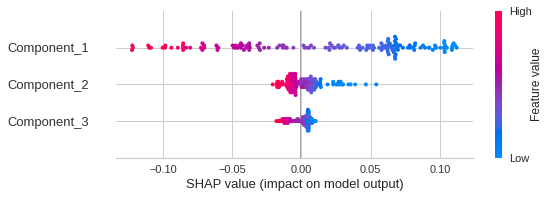

In [ ]:
interpret_model(tuned_et_pca, plot='summary')


In [ ]:
interpret_model(tuned_et_pca, plot='reason', observation=32)

In [ ]:
interpret_model(tuned_et_pca, plot='reason')